In [1]:
!git clone https://github.com/huggingface/diffusers
!cd diffusers

Cloning into 'diffusers'...
remote: Enumerating objects: 60371, done.
remote: Counting objects: 100% (369/369), done.
remote: Compressing objects: 100% (241/241), done.
remote: Total 60371 (delta 222), reused 214 (delta 115), pack-reused 60002
Receiving objects: 100% (60371/60371), 41.81 MiB | 27.15 MiB/s, done.
Resolving deltas: 100% (43926/43926), done.


In [2]:
import os

print(os.getcwd())

os.chdir("/content/diffusers")

print(os.getcwd())

/content
/content/diffusers


In [3]:
!pip install -e .

Obtaining file:///content/diffusers
  Installing build dependencies ... done
  Checking if build backend supports build_editable ... done
  Getting requirements to build editable ... done
  Preparing editable metadata (pyproject.toml) ... done
  Building editable for diffusers (pyproject.toml) ... done
  Created wheel for diffusers: filename=diffusers-0.28.0.dev0-0.editable-py3-none-any.whl size=11104 sha256=90fa90f335ff80a12f52ac2233270957e0cf4c66bb4cf656f90cf2fe213f93a5
  Stored in directory: /tmp/pip-ephem-wheel-cache-ek0iwhng/wheels/95/c5/3b/e1b4269f8a2584de57e75f949a185b48fc4144e9a91fc9965a
Successfully built diffusers


In [4]:
import huggingface_hub

huggingface_hub.login()

In [5]:
os.chdir("/content/diffusers/examples/instruct_pix2pix")

print(os.getcwd())

/content/diffusers/examples/instruct_pix2pix


In [6]:
!pip install -r requirements.txt

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 297.6/297.6 kB 3.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 542.0/542.0 kB 14.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.4/54.4 kB 8.1 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manyl

In [7]:
!accelerate config default

accelerate configuration saved at /root/.cache/huggingface/accelerate/default_config.yaml


In [8]:
print(os.getcwd())

/content/diffusers/examples/instruct_pix2pix


In [9]:
!pip install xformers

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 222.5/222.5 MB 5.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 755.5/755.5 MB 1.6 MB/s eta 0:00:00
  Attempting uninstall: torch
    Found existing installation: torch 2.2.1+cu121
    Uninstalling torch-2.2.1+cu121:
      Successfully uninstalled torch-2.2.1+cu121
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
torchaudio 2.2.1+cu121 requires torch==2.2.1, but you have torch 2.2.2 which is incompatible.
torchtext 0.17.1 requires torch==2.2.1, but you have torch 2.2.2 which is incompatible.
torchvision 0.17.1+cu121 requires torch==2.2.1, but you have torch 2.2.2 which is incompatible.


In [12]:
!accelerate launch --mixed_precision="fp16" train_instruct_pix2pix.py \
    --pretrained_model_name_or_path="runwayml/stable-diffusion-v1-5" \
    --dataset_name="zero-jin/ai-solution_dataset" \
    --enable_xformers_memory_efficient_attention \
    --resolution=256 --random_flip \
    --train_batch_size=4 --gradient_accumulation_steps=4 --gradient_checkpointing \
    --max_train_steps=1500 \
    --num_train_epochs=1 \
    --checkpointing_steps=5000 --checkpoints_total_limit=1 \
    --learning_rate=5e-05 --max_grad_norm=1 --lr_warmup_steps=0 \
    --conditioning_dropout_prob=0.05 \
    --mixed_precision=fp16 \
    --seed=42 \
    --push_to_hub

2024-04-20 09:01:53.357670: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-04-20 09:01:53.357729: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-04-20 09:01:53.359360: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-04-20 09:01:54.420588: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
04/20/2024 09:01:55 - INFO - __main__ - Distributed environment: NO
Num processes: 1
Process index: 0
Local process index: 0
Device: cuda

Mixed precision type: fp16

{'timestep_spacing', 'variance_type', 'rescale_betas_zero_snr', 'clip_samp

In [1]:
from datasets import load_dataset

dataset = load_dataset("fusing/instructpix2pix-1000-samples")

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


Generating train split:   0%|          | 0/1000 [00:00<?, ? examples/s]

In [2]:
dataset

DatasetDict({
    train: Dataset({
        features: ['input_image', 'edit_prompt', 'edited_image'],
        num_rows: 1000
    })
})

In [3]:
from datasets import load_dataset

new = load_dataset("zero-jin/ai-solution_dataset")

In [4]:
new

DatasetDict({
    train: Dataset({
        features: ['input_image', 'edit_prompt', 'edited_image'],
        num_rows: 528
    })
})

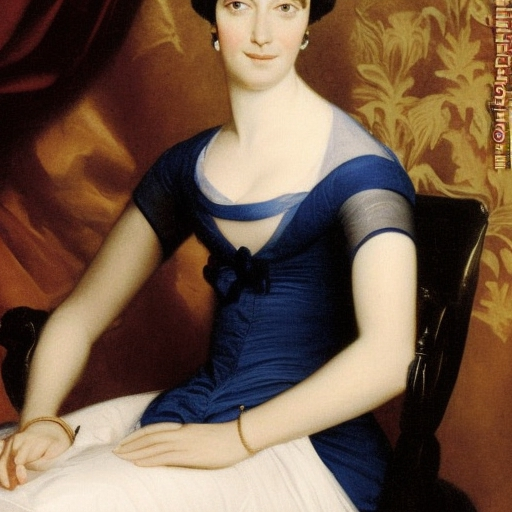

In [5]:
dataset['train']['input_image'][0]

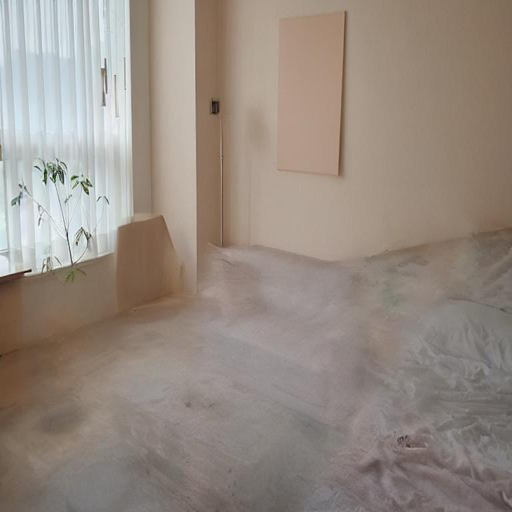

In [6]:
new['train']['input_image'][0]

In [7]:
dataset['train']['edit_prompt'][0]

'Turn it into a photo'

In [8]:
new['train']['edit_prompt'][0]

['studio apartment', '10 square meters', 'vintage home style']

In [ ]:
!pip install diffusers

In [15]:
from diffusers import DiffusionPipeline

pipeline = DiffusionPipeline.from_pretrained("zero-jin/instruct-pix2pix-model")

ImportError: cannot import name 'DiffusionPipeline' from 'diffusers' (unknown location)

In [2]:
!pip install diffusers

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 15.1 MB/s eta 0:00:00


In [4]:
from diffusers import StableDiffusionXLInstructPix2PixPipeline
from diffusers.utils import load_image
from PIL import Image
import torch

init_img = Image.open('/content/test2.jpeg')
init_img.thumbnail((512, 512))
init_img

resolution = 768
image = init_img.resize((resolution, resolution))
edit_instruction = "10 square meters, modern home style, living room, add furniture"

pipe = StableDiffusionXLInstructPix2PixPipeline.from_pretrained(
    "diffusers/sdxl-instructpix2pix-768", torch_dtype=torch.float16
).to("cuda")

edited_image = pipe(
    prompt=edit_instruction,
    image=image,
    height=resolution,
    width=resolution,
    guidance_scale=3.0,
    image_guidance_scale=1.5,
    num_inference_steps=30,
).images[0]


Cannot initialize model with low cpu memory usage because `accelerate` was not found in the environment. Defaulting to `low_cpu_mem_usage=False`. It is strongly recommended to install `accelerate` for faster and less memory-intense model loading. You can do so with: 
```
pip install accelerate
```
.
/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:88: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model_index.json:   0%|          | 0.00/660 [00:00<?, ?B/s]

Fetching 18 files:   0%|          | 0/18 [00:00<?, ?it/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/737 [00:00<?, ?B/s]

text_encoder_2/config.json:   0%|          | 0.00/633 [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

text_encoder/config.json:   0%|          | 0.00/623 [00:00<?, ?B/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

tokenizer_2/special_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

tokenizer_2/tokenizer_config.json:   0%|          | 0.00/725 [00:00<?, ?B/s]

tokenizer_2/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/1.77k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.39G [00:00<?, ?B/s]

tokenizer_2/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/246M [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/659 [00:00<?, ?B/s]

scheduler/scheduler_config.json:   0%|          | 0.00/479 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/10.3G [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

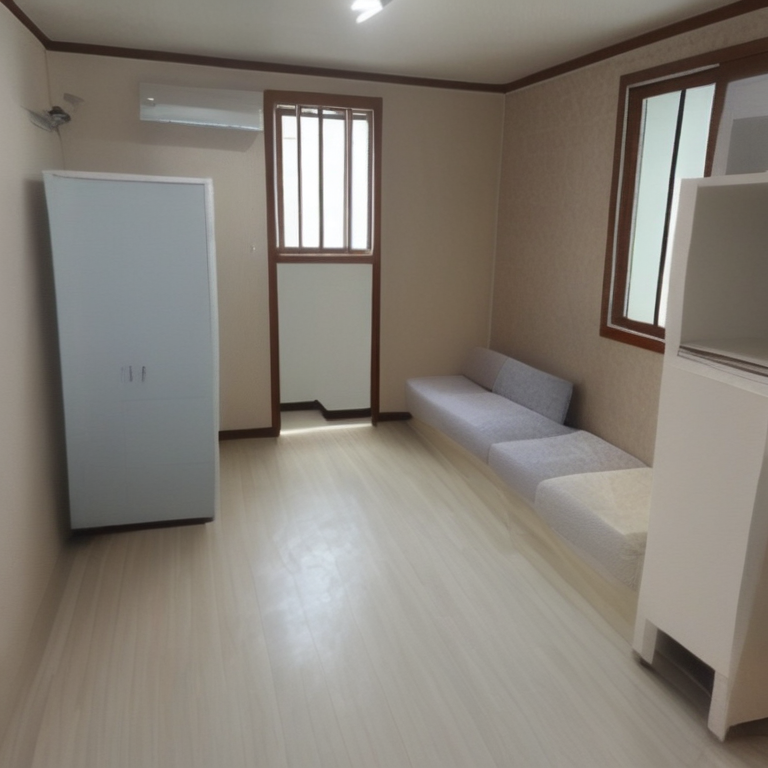

In [5]:
edited_image

In [6]:
edit_instruction = "modern home style, add furniture, high quality"

edited_image = pipe(
    prompt=edit_instruction,
    image=image,
    height=resolution,
    width=resolution,
    guidance_scale=3.0,
    image_guidance_scale=1.5,
    num_inference_steps=30,
).images[0]


Cannot initialize model with low cpu memory usage because `accelerate` was not found in the environment. Defaulting to `low_cpu_mem_usage=False`. It is strongly recommended to install `accelerate` for faster and less memory-intense model loading. You can do so with: 
```
pip install accelerate
```
.


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

In [8]:
edit_instruction = "modern home style, add furniture, high quality"

edited_image = pipe(
    prompt=edit_instruction,
    image=image,
    height=resolution,
    width=resolution,
    guidance_scale=3.0,
    image_guidance_scale=1.5,
    num_inference_steps=30,
).images[0]


  0%|          | 0/30 [00:00<?, ?it/s]

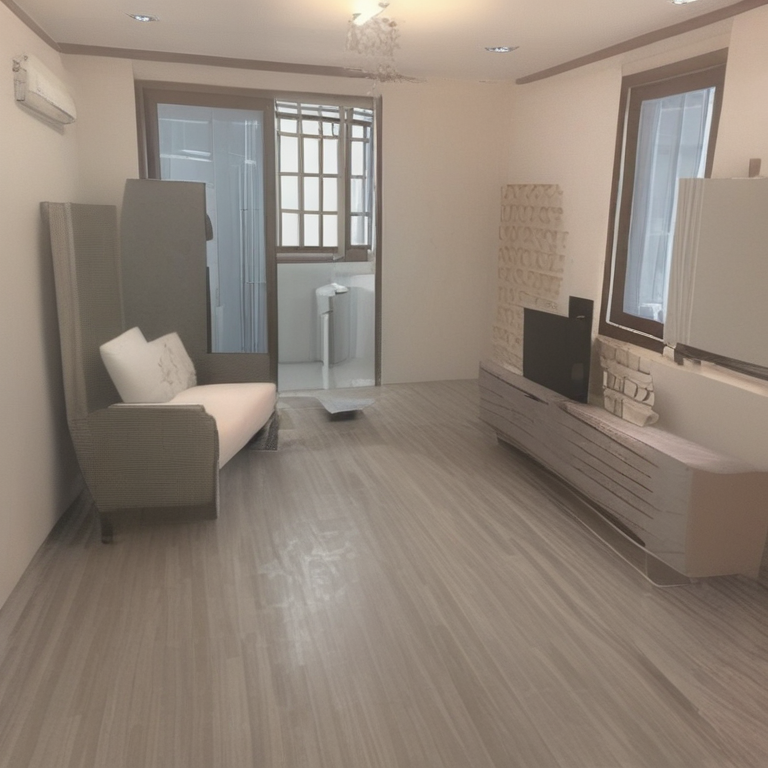

In [9]:
edited_image

  0%|          | 0/30 [00:00<?, ?it/s]

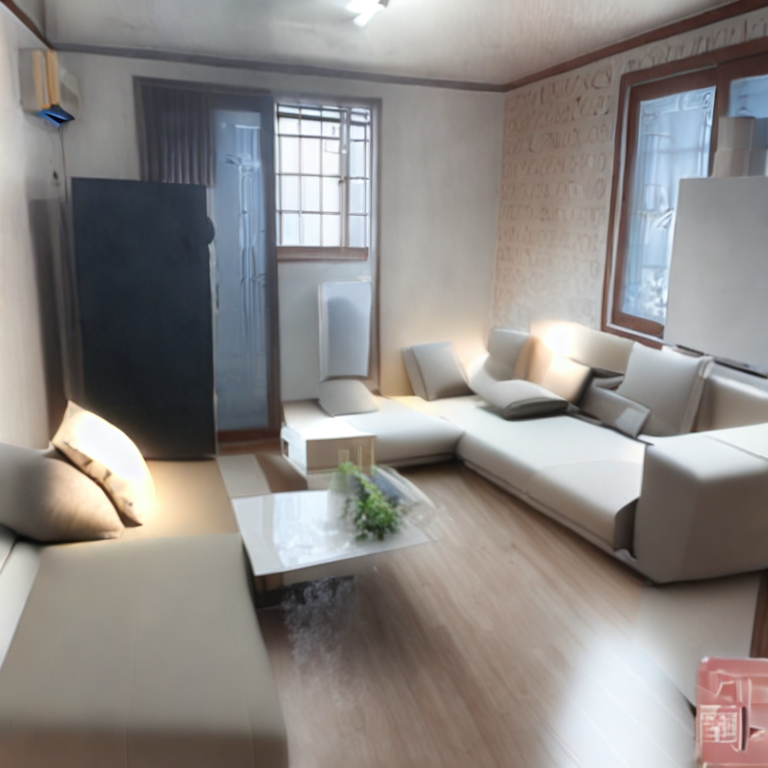

In [10]:
edit_instruction = "modern home style, add furniture, high quality"

edited_image = pipe(
    prompt=edit_instruction,
    image=image,
    height=resolution,
    width=resolution,
    guidance_scale=15.0,
    image_guidance_scale=1.5,
    num_inference_steps=30,
).images[0]
edited_image

  0%|          | 0/30 [00:00<?, ?it/s]

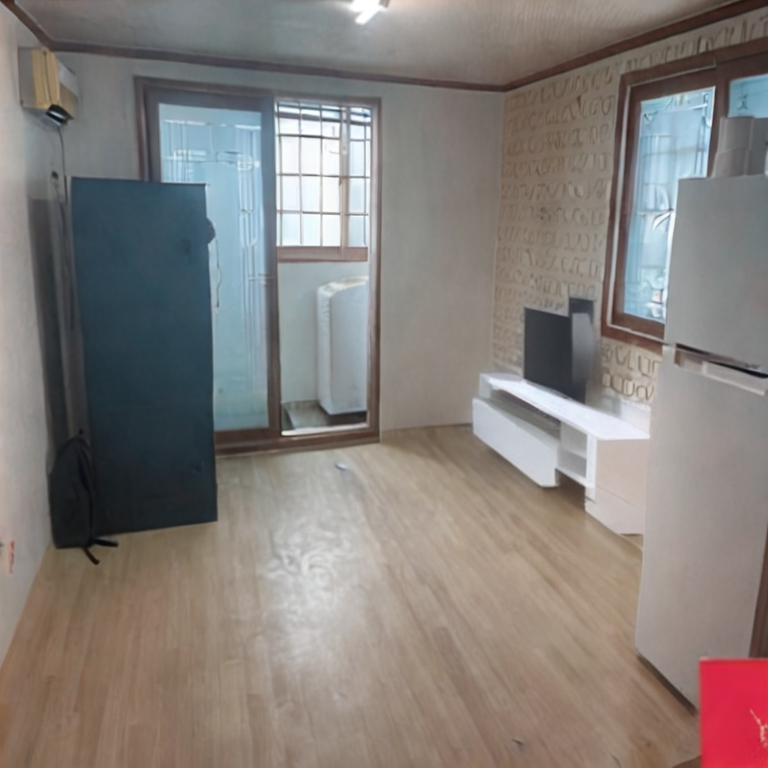

In [13]:
edit_instruction = "modern home style, add furniture, high quality"

edited_image = pipe(
    prompt=edit_instruction,
    image=image,
    height=resolution,
    width=resolution,
    guidance_scale=10.0,
    image_guidance_scale=1.5,
    num_inference_steps=30,
).images[0]
edited_image

  0%|          | 0/30 [00:00<?, ?it/s]

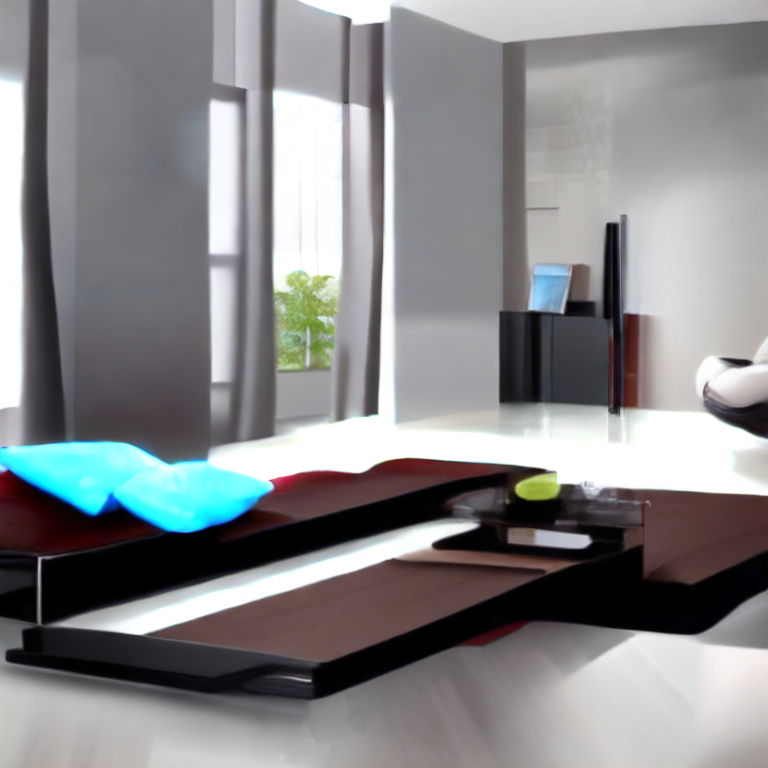

In [14]:
edit_instruction = "modern home style, add furniture, high quality"

edited_image = pipe(
    prompt=edit_instruction,
    image=image,
    height=resolution,
    width=resolution,
    guidance_scale=20.0,
    image_guidance_scale=1.5,
    num_inference_steps=30,
).images[0]
edited_image

  0%|          | 0/30 [00:00<?, ?it/s]

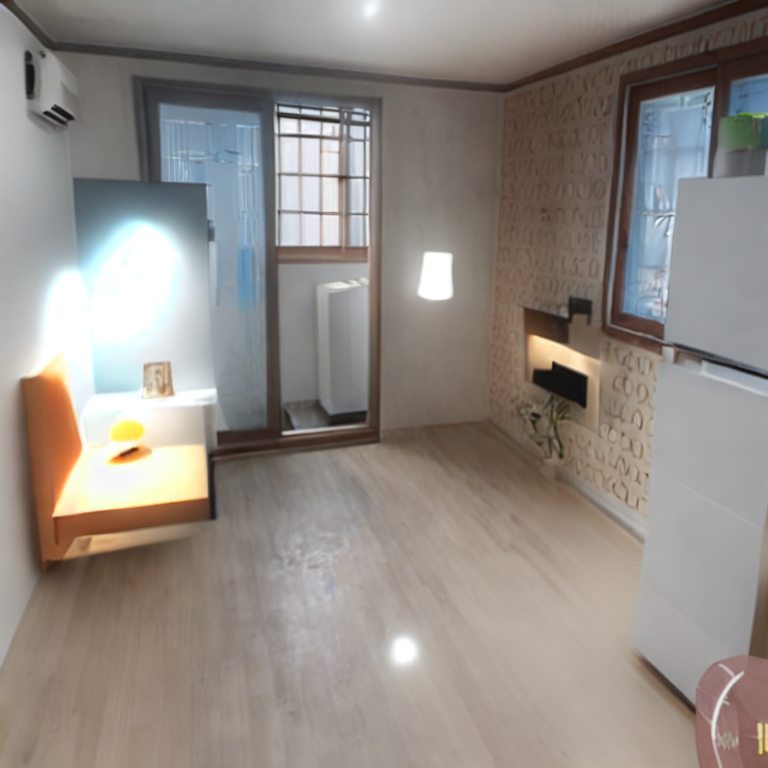

In [15]:
edit_instruction = "modern home style, add furniture, high quality"

edited_image = pipe(
    prompt=edit_instruction,
    image=image,
    height=resolution,
    width=resolution,
    guidance_scale=15.0,
    image_guidance_scale=1.5,
    num_inference_steps=30,
).images[0]
edited_image

  0%|          | 0/30 [00:00<?, ?it/s]

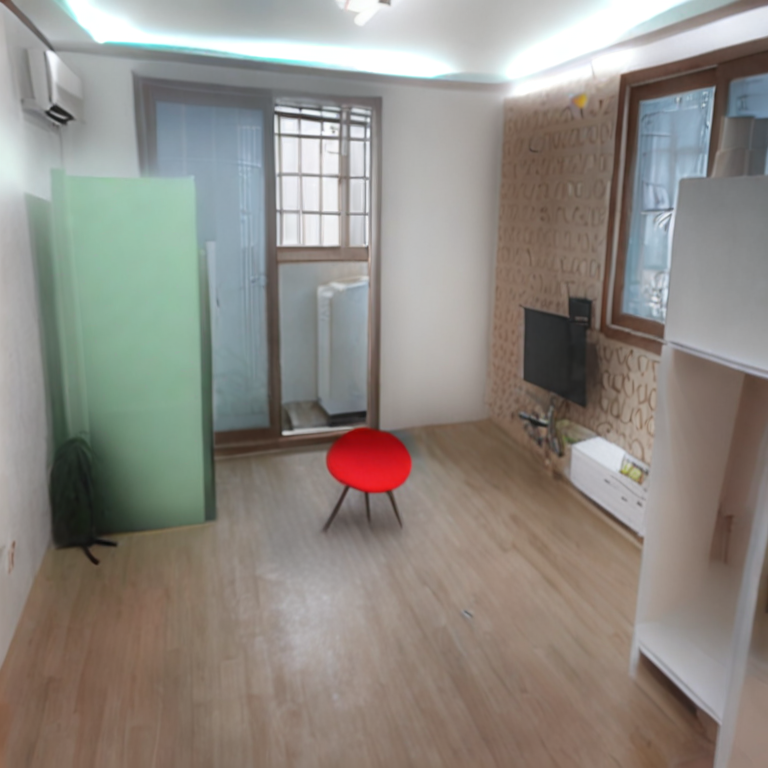

In [17]:
edit_instruction = "modern home style, add furniture, high quality"

edited_image = pipe(
    prompt=edit_instruction,
    image=image,
    height=resolution,
    width=resolution,
    guidance_scale=13.0,
    image_guidance_scale=1.5,
    num_inference_steps=30,
).images[0]
edited_image

  0%|          | 0/50 [00:00<?, ?it/s]

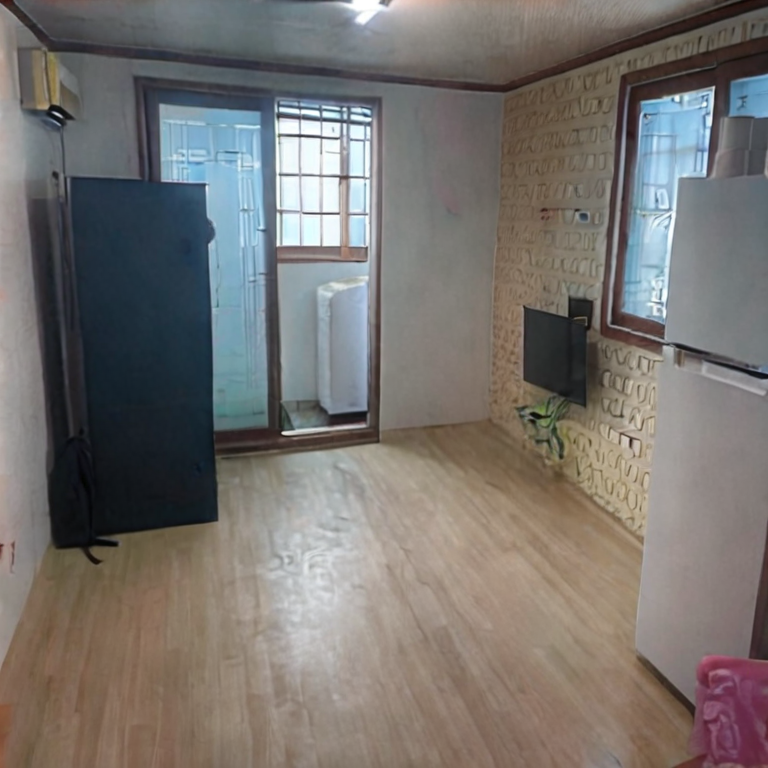

In [18]:
edit_instruction = "modern home style, add furniture, high quality"

edited_image = pipe(
    prompt=edit_instruction,
    image=image,
    height=resolution,
    width=resolution,
    guidance_scale=13.0,
    image_guidance_scale=1.5,
    num_inference_steps=50,
).images[0]
edited_image

  0%|          | 0/50 [00:00<?, ?it/s]

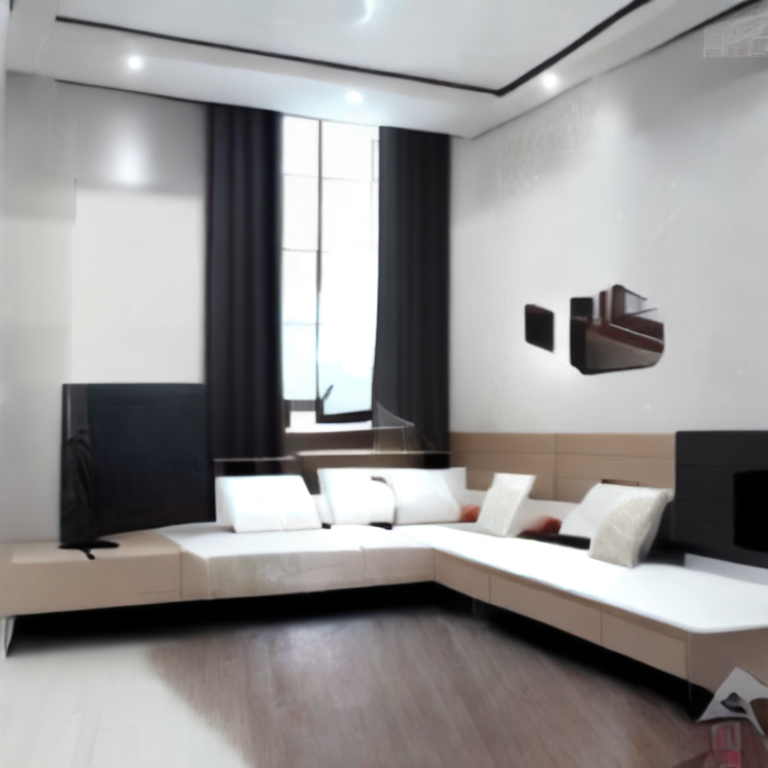

In [19]:
edit_instruction = "modern home style, add furniture, high quality"

edited_image = pipe(
    prompt=edit_instruction,
    image=image,
    height=resolution,
    width=resolution,
    guidance_scale=15.0,
    image_guidance_scale=1.5,
    num_inference_steps=30,
).images[0]
edited_image

  0%|          | 0/30 [00:00<?, ?it/s]

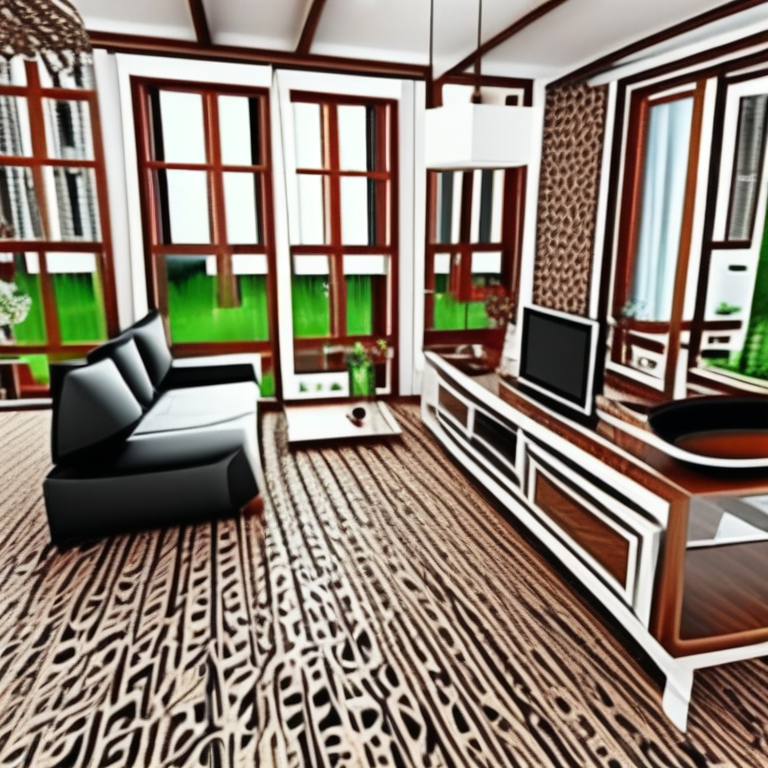

In [25]:
edit_instruction = "modern home style, add furniture, high quality"
# negative_instruction = "do alter overall architecture of the room"
edited_image = pipe(
    prompt=edit_instruction,
    negative_prompt=negative_instruction,
    image=image,
    height=resolution,
    width=resolution,
    guidance_scale=15.0,
    image_guidance_scale=1.5,
    num_inference_steps=30,
).images[0]
edited_image

  0%|          | 0/30 [00:00<?, ?it/s]

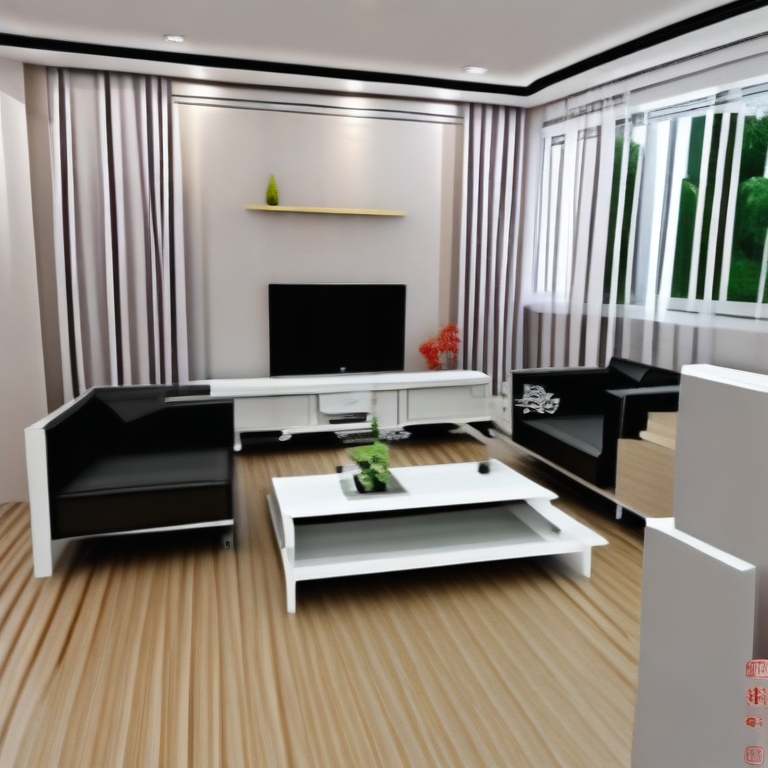

In [26]:
edit_instruction = "modern home style, add furniture, high quality"
negative_instruction = ""
edited_image = pipe(
    prompt=edit_instruction,
    negative_prompt=negative_instruction,
    image=image,
    height=resolution,
    width=resolution,
    guidance_scale=15.0,
    image_guidance_scale=1.5,
    num_inference_steps=30,
).images[0]
edited_image

  0%|          | 0/30 [00:00<?, ?it/s]

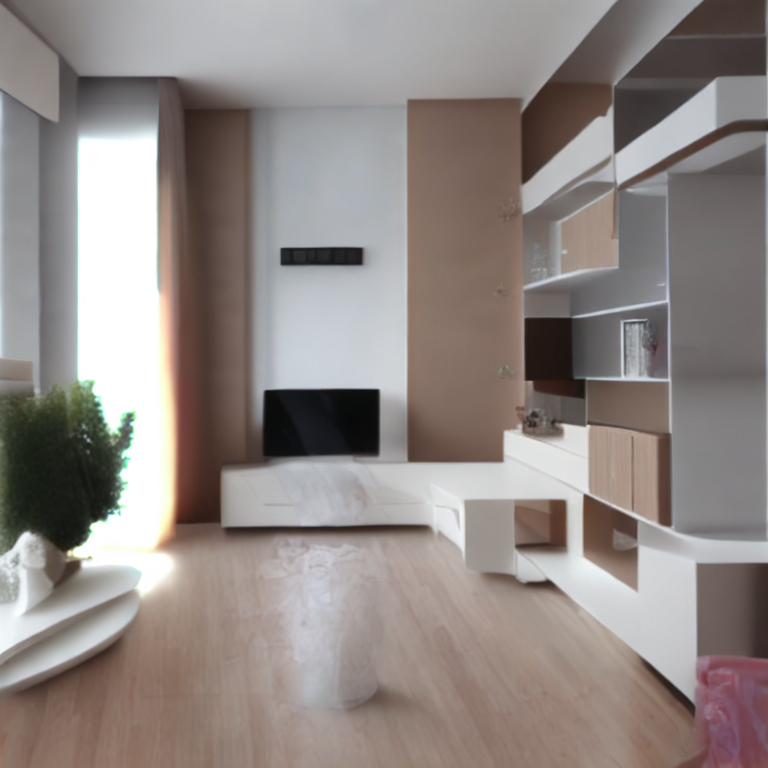

In [27]:
edit_instruction = "modern home style, add furniture, high quality"
# negative_instruction = ""
edited_image = pipe(
    prompt=edit_instruction,
    # negative_prompt=negative_instruction,
    image=image,
    height=resolution,
    width=resolution,
    guidance_scale=15.0,
    image_guidance_scale=1.5,
    num_inference_steps=30,
).images[0]
edited_image

  0%|          | 0/30 [00:00<?, ?it/s]

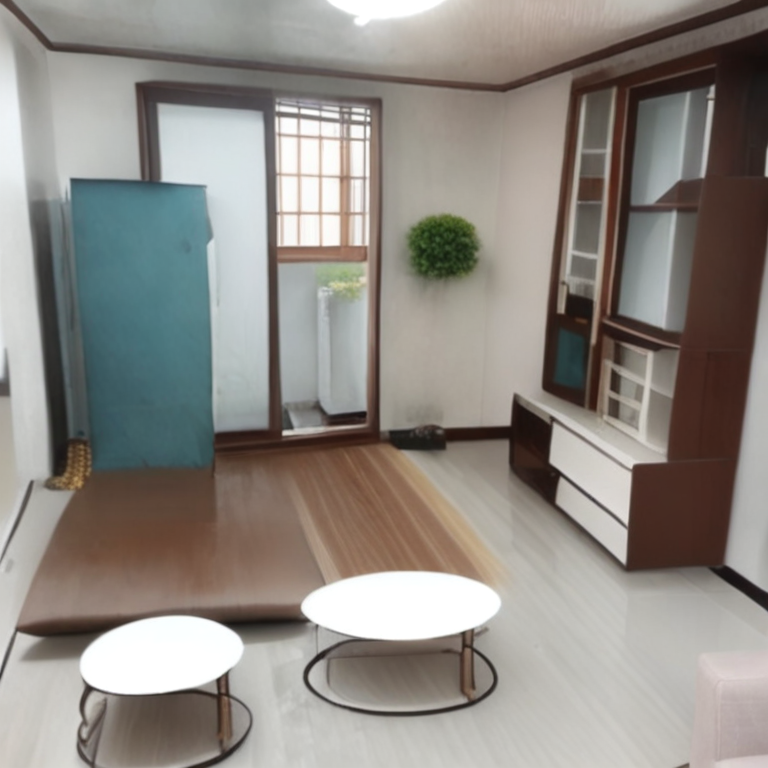

In [28]:
edit_instruction = "modern home style, add furniture, high quality"
# negative_instruction = ""
edited_image = pipe(
    prompt=edit_instruction,
    # negative_prompt=negative_instruction,
    image=image,
    height=resolution,
    width=resolution,
    guidance_scale=10.0,
    image_guidance_scale=1.5,
    num_inference_steps=30,
).images[0]
edited_image

In [29]:
from diffusers import AutoPipelineForImage2Image
from diffusers.utils import load_image
import torch

pipe = AutoPipelineForImage2Image.from_pretrained("stabilityai/sdxl-turbo", torch_dtype=torch.float16, variant="fp16")
pipe.to("cuda")



model_index.json:   0%|          | 0.00/685 [00:00<?, ?B/s]

Cannot initialize model with low cpu memory usage because `accelerate` was not found in the environment. Defaulting to `low_cpu_mem_usage=False`. It is strongly recommended to install `accelerate` for faster and less memory-intense model loading. You can do so with: 
```
pip install accelerate
```
.


Fetching 18 files:   0%|          | 0/18 [00:00<?, ?it/s]

text_encoder_2/config.json:   0%|          | 0.00/575 [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/586 [00:00<?, ?B/s]

text_encoder/config.json:   0%|          | 0.00/565 [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/704 [00:00<?, ?B/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

scheduler/scheduler_config.json:   0%|          | 0.00/459 [00:00<?, ?B/s]

model.fp16.safetensors:   0%|          | 0.00/246M [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

model.fp16.safetensors:   0%|          | 0.00/1.39G [00:00<?, ?B/s]

tokenizer_2/special_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

tokenizer_2/tokenizer_config.json:   0%|          | 0.00/855 [00:00<?, ?B/s]

tokenizer_2/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/1.78k [00:00<?, ?B/s]

tokenizer_2/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/607 [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.safetensors:   0%|          | 0.00/5.14G [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.safetensors:   0%|          | 0.00/167M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

StableDiffusionXLImg2ImgPipeline {
  "_class_name": "StableDiffusionXLImg2ImgPipeline",
  "_diffusers_version": "0.27.2",
  "_name_or_path": "stabilityai/sdxl-turbo",
  "feature_extractor": [
    null,
    null
  ],
  "force_zeros_for_empty_prompt": true,
  "image_encoder": [
    null,
    null
  ],
  "requires_aesthetics_score": false,
  "scheduler": [
    "diffusers",
    "EulerAncestralDiscreteScheduler"
  ],
  "text_encoder": [
    "transformers",
    "CLIPTextModel"
  ],
  "text_encoder_2": [
    "transformers",
    "CLIPTextModelWithProjection"
  ],
  "tokenizer": [
    "transformers",
    "CLIPTokenizer"
  ],
  "tokenizer_2": [
    "transformers",
    "CLIPTokenizer"
  ],
  "unet": [
    "diffusers",
    "UNet2DConditionModel"
  ],
  "vae": [
    "diffusers",
    "AutoencoderKL"
  ]
}

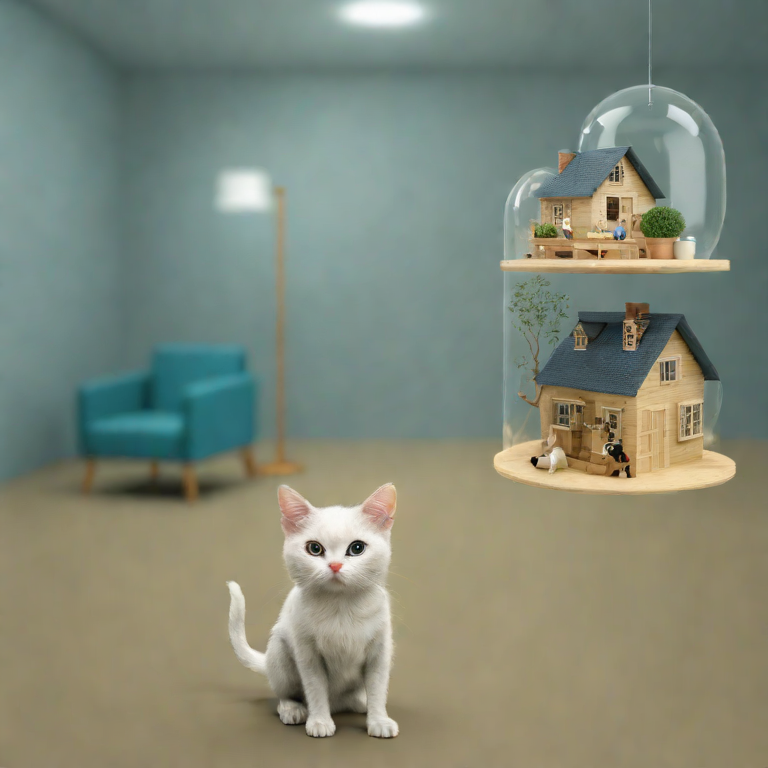

In [34]:
image

  0%|          | 0/15 [00:00<?, ?it/s]

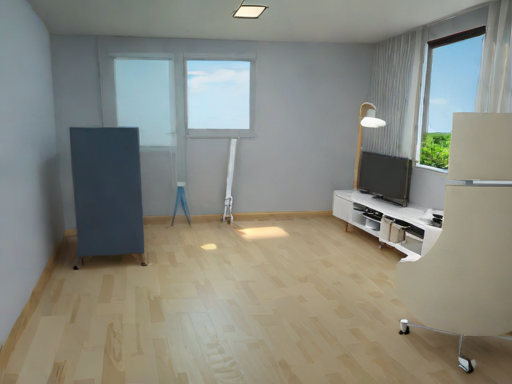

In [36]:
init_img = Image.open('/content/test2.jpeg')
init_img.thumbnail((512, 512))
init_img

prompt = "modern home style, add furniture, high quality"

image = pipe(
    prompt,
    image=init_img,
    num_inference_steps=15,
    strength=0.5,
    guidance_scale=0.0).images[0]

image

  0%|          | 0/7 [00:00<?, ?it/s]

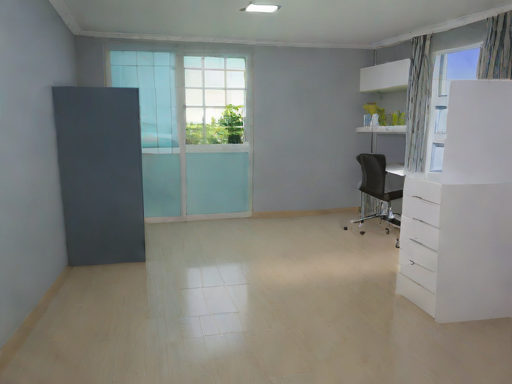

In [37]:
prompt = "modern home style, add furniture, high quality"

image = pipe(
    prompt,
    image=init_img,
    num_inference_steps=15,
    strength=0.5,
    guidance_scale=0.0).images[0]

image

  0%|          | 0/3 [00:00<?, ?it/s]

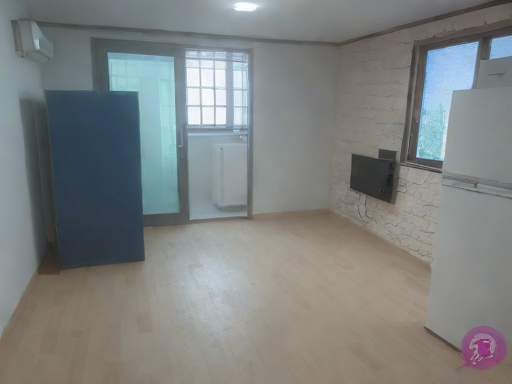

In [40]:
prompt = "modern home style, add furniture, high quality"
negative_prompt = 'do alter overall architecture of the room'
image = pipe(
    prompt,
    negative_prompt=negative_prompt,
    image=init_img,
    num_inference_steps=15,
    strength=0.2,
    guidance_scale=0.0).images[0]

image

  0%|          | 0/8 [00:00<?, ?it/s]

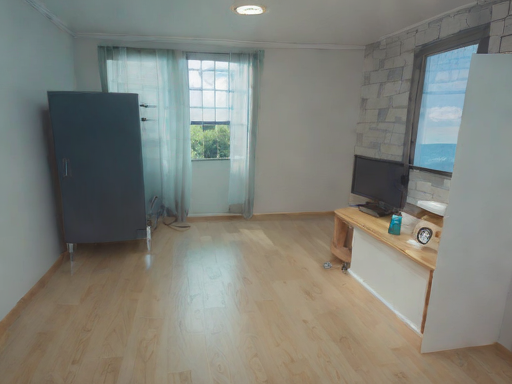

In [50]:
prompt = "modern home style, add furniture, high quality"
negative_prompt = 'change the shape of the room'
image = pipe(
    prompt,
    negative_prompt=negative_prompt,
    image=init_img,
    num_inference_steps=20,
    strength=0.4,
    guidance_scale=0.0).images[0]

image

  0%|          | 0/9 [00:00<?, ?it/s]

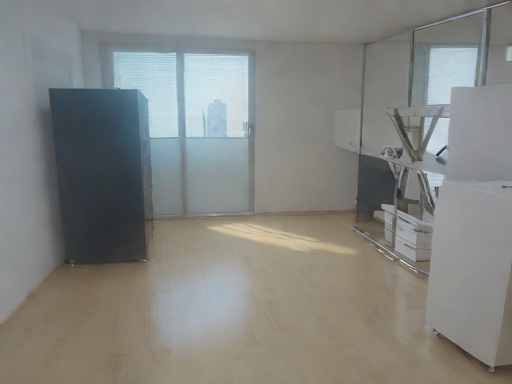

In [52]:
prompt = "modern home style, add furniture, high quality"
negative_prompt = 'change the shape of the room'
image = pipe(
    prompt,
    negative_prompt=negative_prompt,
    image=init_img,
    num_inference_steps=20,
    strength=0.45,
    guidance_scale=0.0).images[0]

image

  0%|          | 0/9 [00:00<?, ?it/s]

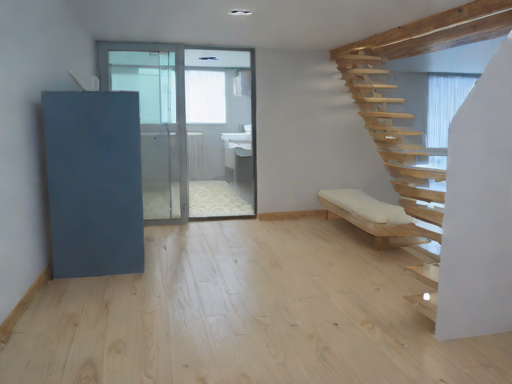

In [53]:
prompt = "modern home style, add furniture, high quality"
negative_prompt = 'change the shape of the room'
image = pipe(
    prompt,
    negative_prompt=negative_prompt,
    image=init_img,
    num_inference_steps=20,
    strength=0.45,
    guidance_scale=0.0).images[0]

image